# Import necessary libraries

In [1]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Model metrics for evaluation and data splitting
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score, mean_absolute_error

from sklearn import metrics

from sklearn.model_selection import train_test_split, cross_val_score

# Visualization for missing data
import missingno as msno

# Hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

# Model building
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (
    AdaBoostRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor,
    BaggingRegressor,
)

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

from xgboost import XGBRegressor

#SHAP
import shap

In [2]:
All = pd.ExcelFile('allData.xls')
data = pd.read_excel(All, 'Data')
data

,Number,Data source,Selected,Mix number in literature,ASTM type 1 ordinary Portland Cement content (kg/m^3),CEM I 42.5N ordinary Portland Cement content (kg/m^3),CEM I 52.5N ordinary Portland Cement content (kg/m^3),Class C Fly ash content (kg/m^3),Class F Fly ash content (kg/m^3),Slag content (kg/m^3),...,Annual average temperature of exposed environment (Celsius degree),Annual wetting times/rainy days of exposed environment (d),Annual average precipitation of exposed environment (mm),Slump (mm),Average 28-day compressive strength (Mpa),Average 28-day split strength (Mpa),Chloride diffusion coefficient (10-12 m2/s),Average carbonation coefficient (mm/year^0.5),Specimen size,Note
0,NaN,2. Yunusa 2014,NaN,PC-40,0.000,0.000,450.000,0.000,0.000,0.000,...,24.300,0.000,0.000,30.000,75.930,NaN,NaN,3.139,NaN,No significant effect of initial water curing ...
1,NaN,2. Yunusa 2014,NaN,PC-50,0.000,0.000,400.000,0.000,0.000,0.000,...,24.300,0.000,0.000,60.000,64.500,NaN,NaN,4.022,NaN,NaN
2,NaN,2. Yunusa 2014,NaN,PC-60,0.000,0.000,350.000,0.000,0.000,0.000,...,24.300,0.000,0.000,100.000,49.230,NaN,NaN,6.670,NaN,NaN
3,NaN,2. Yunusa 2014,NaN,PC-75,0.000,0.000,300.000,0.000,0.000,0.000,...,24.300,0.000,0.000,140.000,36.000,NaN,NaN,7.945,NaN,NaN
4,NaN,2. Yunusa 2014,NaN,FA-40,0.000,0.000,315.000,0.000,135.000,0.000,...,24.300,0.000,0.000,40.000,62.800,NaN,NaN,6.052,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,NaN,"J48. Farahani, 2015",NaN,W3-4,350.000,0.000,0.000,0.000,0.000,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.550,NaN,150*150*150,NaN
1984,NaN,"J48. Farahani, 2015",NaN,W4-1,380.000,0.000,0.000,0.000,0.000,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,3.375,NaN,150*150*150,NaN
1985,NaN,"J48. Farahani, 2015",NaN,W4-2,370.000,0.000,0.000,0.000,0.000,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.000,NaN,150*150*150,NaN
1986,NaN,"J48. Farahani, 2015",NaN,W4-3,360.000,0.000,0.000,0.000,0.000,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,0.500,NaN,150*150*150,NaN


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1988 entries, 0 to 1987
Data columns (total 34 columns):
 #   Column                                                              Non-Null Count  Dtype  
---  ------                                                              --------------  -----  
 0   Number                                                              0 non-null      float64
 1   Data source                                                         1988 non-null   object 
 2   Selected                                                            194 non-null    object 
 3   Mix number in literature                                            1988 non-null   object 
 4   ASTM type 1 ordinary Portland Cement content (kg/m^3)               1988 non-null   float64
 5   CEM I 42.5N ordinary Portland Cement content (kg/m^3)               1988 non-null   float64
 6   CEM I 52.5N ordinary Portland Cement content (kg/m^3)               1988 non-null   float64
 7   Class C Fly ash

In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Number,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ASTM type 1 ordinary Portland Cement content (kg/m^3),1988.000,39.318,106.826,0.000,0.000,0.000,0.000,702.000
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1988.000,95.567,146.591,0.000,0.000,0.000,210.000,547.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1988.000,147.093,152.375,0.000,0.000,155.000,280.000,660.000
Class C Fly ash content (kg/m^3),1988.000,6.120,28.792,0.000,0.000,0.000,0.000,225.000
Class F Fly ash content (kg/m^3),1988.000,35.498,65.745,0.000,0.000,0.000,56.500,544.000
Slag content (kg/m^3),1988.000,34.630,73.838,0.000,0.000,0.000,0.000,440.000
Silica fume content (kg/m^3),1988.000,7.593,21.082,0.000,0.000,0.000,0.000,150.000
Water content (kg/m^3),1988.000,172.241,28.372,105.000,153.000,170.000,186.000,295.000
Superplasticizer content (kg/m^3),1988.000,2.336,4.726,0.000,0.000,0.000,2.703,35.100


In [5]:
data.duplicated().sum()

0

In [6]:
data.isnull().sum()

Number                                                                1988
Data source                                                              0
Selected                                                              1794
Mix number in literature                                                 0
ASTM type 1 ordinary Portland Cement content (kg/m^3)                    0
CEM I 42.5N ordinary Portland Cement content (kg/m^3)                    0
CEM I 52.5N ordinary Portland Cement content (kg/m^3)                    0
Class C Fly ash content (kg/m^3)                                         0
Class F Fly ash content (kg/m^3)                                         0
Slag content (kg/m^3)                                                    0
Silica fume content (kg/m^3)                                             0
Water content (kg/m^3)                                                   0
Superplasticizer content (kg/m^3)                                        0
Maximum coarse aggregate 

In [7]:
Excess_col_indices =[0] + list(range(2, 4)) + list(range(20, 27)) + [33]
semi_df = data.iloc[:, [col for col in range(data.shape[1]) if col not in Excess_col_indices]]
semi_df

,Data source,ASTM type 1 ordinary Portland Cement content (kg/m^3),CEM I 42.5N ordinary Portland Cement content (kg/m^3),CEM I 52.5N ordinary Portland Cement content (kg/m^3),Class C Fly ash content (kg/m^3),Class F Fly ash content (kg/m^3),Slag content (kg/m^3),Silica fume content (kg/m^3),Water content (kg/m^3),Superplasticizer content (kg/m^3),...,Curing method,Curing temperature (Celsius degree),Curing humidity (%),Curing day,Slump (mm),Average 28-day compressive strength (Mpa),Average 28-day split strength (Mpa),Chloride diffusion coefficient (10-12 m2/s),Average carbonation coefficient (mm/year^0.5),Specimen size
0,2. Yunusa 2014,0.000,0.000,450.000,0.000,0.000,0.000,0.000,180.000,4.000,...,Submerged,20.000,100.000,3.000,30.000,75.930,NaN,NaN,3.139,NaN
1,2. Yunusa 2014,0.000,0.000,400.000,0.000,0.000,0.000,0.000,200.000,3.250,...,Submerged,20.000,100.000,3.000,60.000,64.500,NaN,NaN,4.022,NaN
2,2. Yunusa 2014,0.000,0.000,350.000,0.000,0.000,0.000,0.000,210.000,0.000,...,Submerged,20.000,100.000,3.000,100.000,49.230,NaN,NaN,6.670,NaN
3,2. Yunusa 2014,0.000,0.000,300.000,0.000,0.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,140.000,36.000,NaN,NaN,7.945,NaN
4,2. Yunusa 2014,0.000,0.000,315.000,0.000,135.000,0.000,0.000,180.000,1.750,...,Submerged,20.000,100.000,3.000,40.000,62.800,NaN,NaN,6.052,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,"J48. Farahani, 2015",350.000,0.000,0.000,0.000,0.000,0.000,50.000,180.000,2.000,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.550,NaN,150*150*150
1984,"J48. Farahani, 2015",380.000,0.000,0.000,0.000,0.000,0.000,20.000,200.000,0.800,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,3.375,NaN,150*150*150
1985,"J48. Farahani, 2015",370.000,0.000,0.000,0.000,0.000,0.000,30.000,200.000,1.200,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.000,NaN,150*150*150
1986,"J48. Farahani, 2015",360.000,0.000,0.000,0.000,0.000,0.000,40.000,200.000,1.800,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,0.500,NaN,150*150*150


In [8]:
semi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1988 entries, 0 to 1987
Data columns (total 23 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Data source                                            1988 non-null   object 
 1   ASTM type 1 ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 2   CEM I 42.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 3   CEM I 52.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 4   Class C Fly ash content (kg/m^3)                       1988 non-null   float64
 5   Class F Fly ash content (kg/m^3)                       1988 non-null   float64
 6   Slag content (kg/m^3)                                  1988 non-null   float64
 7   Silica fume content (kg/m^3)                           1988 non-null   float64
 8   Water content (kg/m^3)                          

In [9]:
semi_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ASTM type 1 ordinary Portland Cement content (kg/m^3),1988.000,39.318,106.826,0.000,0.000,0.000,0.000,702.000
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1988.000,95.567,146.591,0.000,0.000,0.000,210.000,547.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1988.000,147.093,152.375,0.000,0.000,155.000,280.000,660.000
Class C Fly ash content (kg/m^3),1988.000,6.120,28.792,0.000,0.000,0.000,0.000,225.000
Class F Fly ash content (kg/m^3),1988.000,35.498,65.745,0.000,0.000,0.000,56.500,544.000
Slag content (kg/m^3),1988.000,34.630,73.838,0.000,0.000,0.000,0.000,440.000
Silica fume content (kg/m^3),1988.000,7.593,21.082,0.000,0.000,0.000,0.000,150.000
Water content (kg/m^3),1988.000,172.241,28.372,105.000,153.000,170.000,186.000,295.000
Superplasticizer content (kg/m^3),1988.000,2.336,4.726,0.000,0.000,0.000,2.703,35.100
Maximum coarse aggregate size (mm),1988.000,18.122,3.829,9.500,16.000,20.000,20.000,30.000


# EDA

In [10]:
# function to plot a boxplot and a histogram along the same scale.

def hist_boxplot(data, feature, figsize = (12,7),kde = True, bins=None):
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,
        sharex= True,
        gridspec_kw ={'height_ratios': (0.25,0.75)},
        figsize = figsize)
    sns.boxplot(data=data, x =feature, ax = ax_box2, showmeans = True, color = 'violet')

    if bins:
        sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, bins=bins, palette = 'winter')

    else:
        sns.histplot(data=data, x =feature, kde = kde, ax = ax_hist2, palette = 'winter')
    ax_hist2.axvline(data[feature].mean(), color = 'green', linestyle = "--")
    ax_hist2.axvline(data[feature].median(), color = 'black', linestyle = "-")

In [11]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

## Uni variate

In [12]:
num_df = semi_df.select_dtypes(include=np.number)
obj_df = semi_df.select_dtypes(include=['object'])

Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` variable has been assigned.
Ignoring `palette` because no `hue` vari

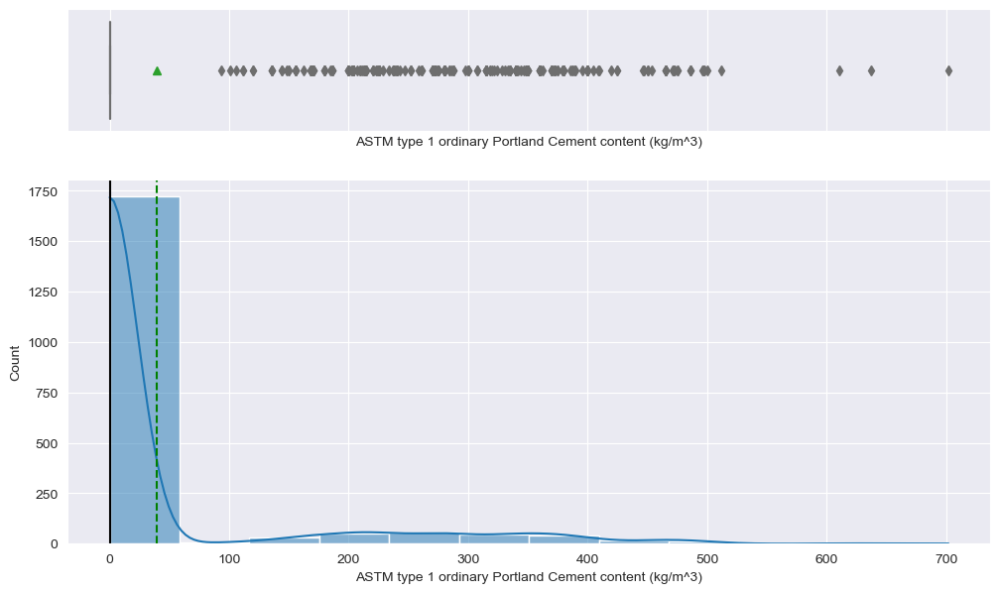

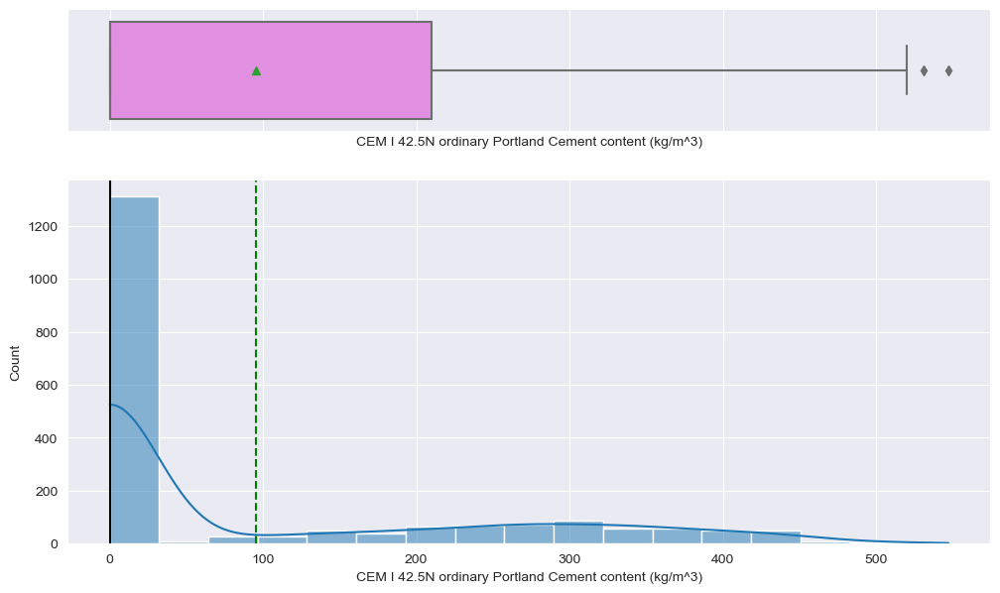

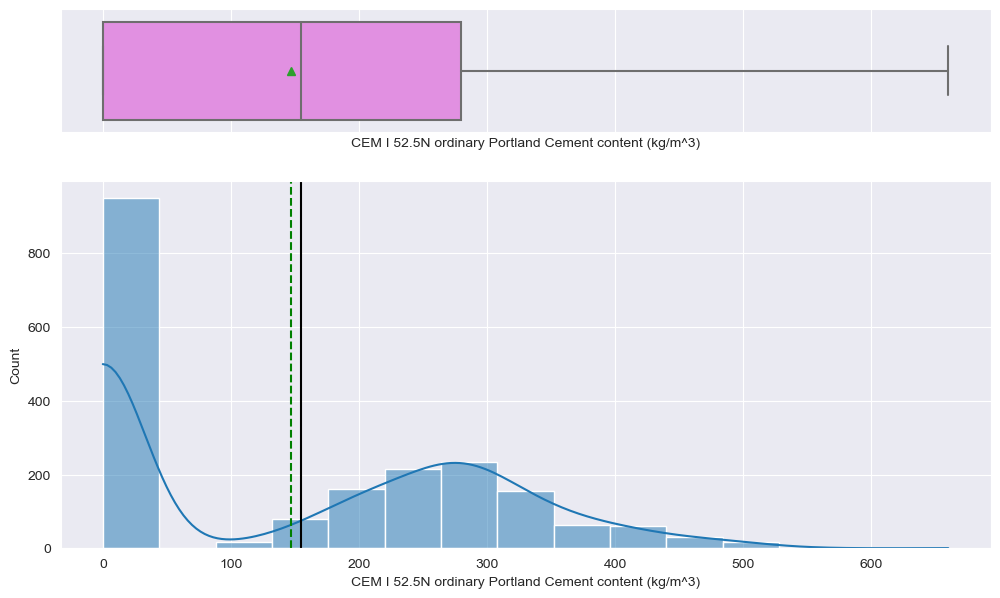

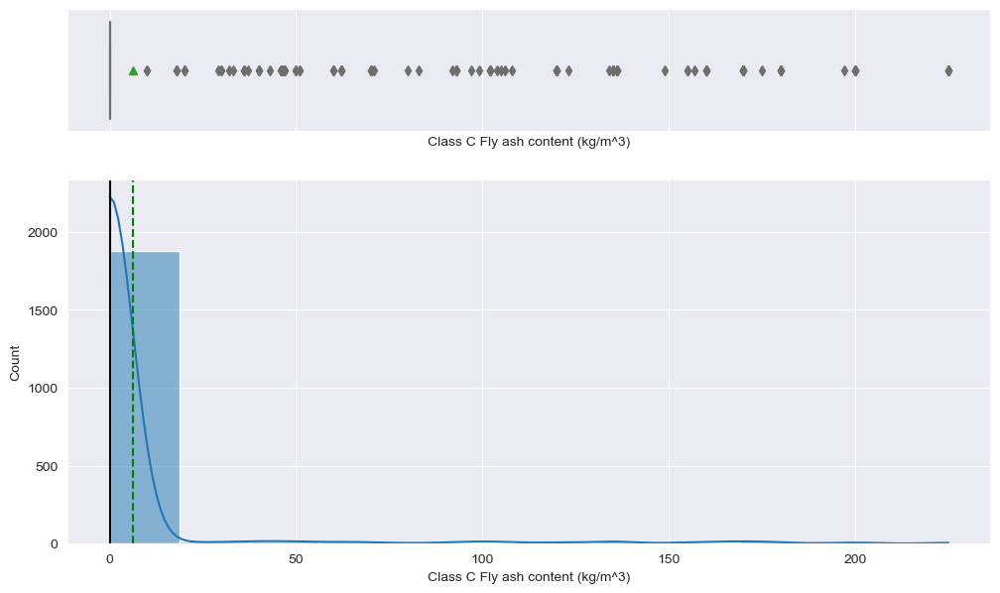

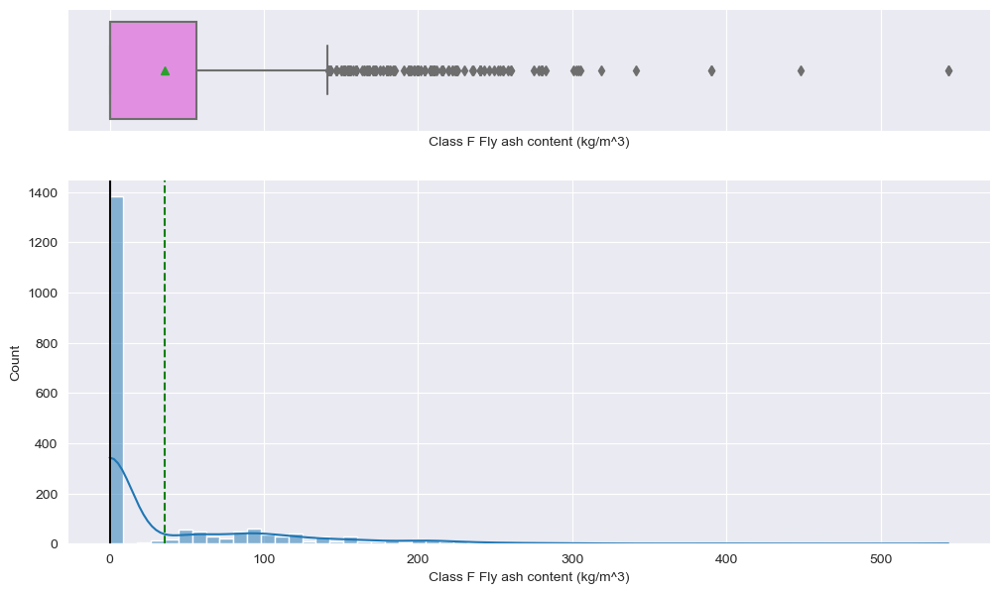

...

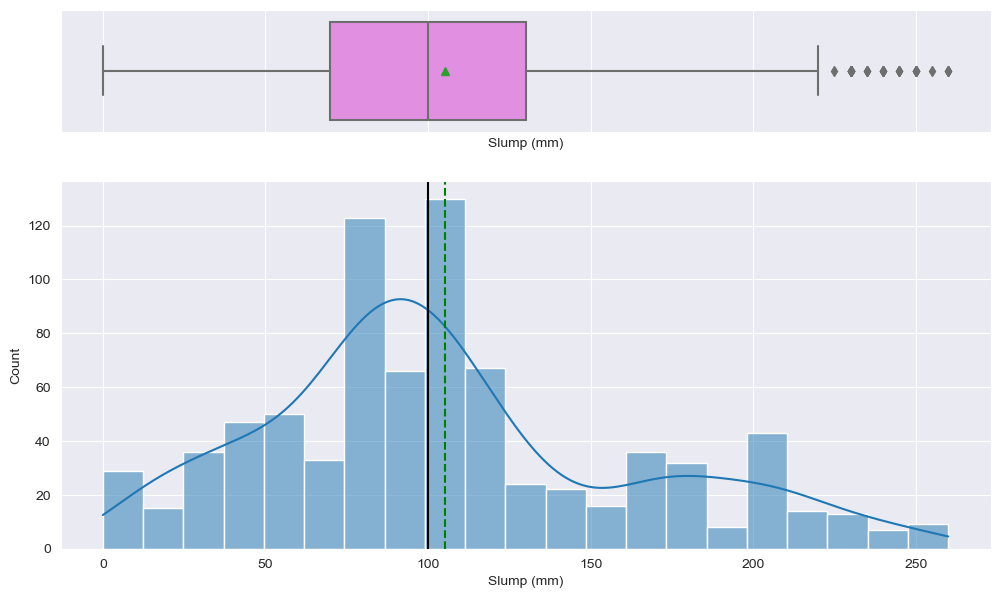

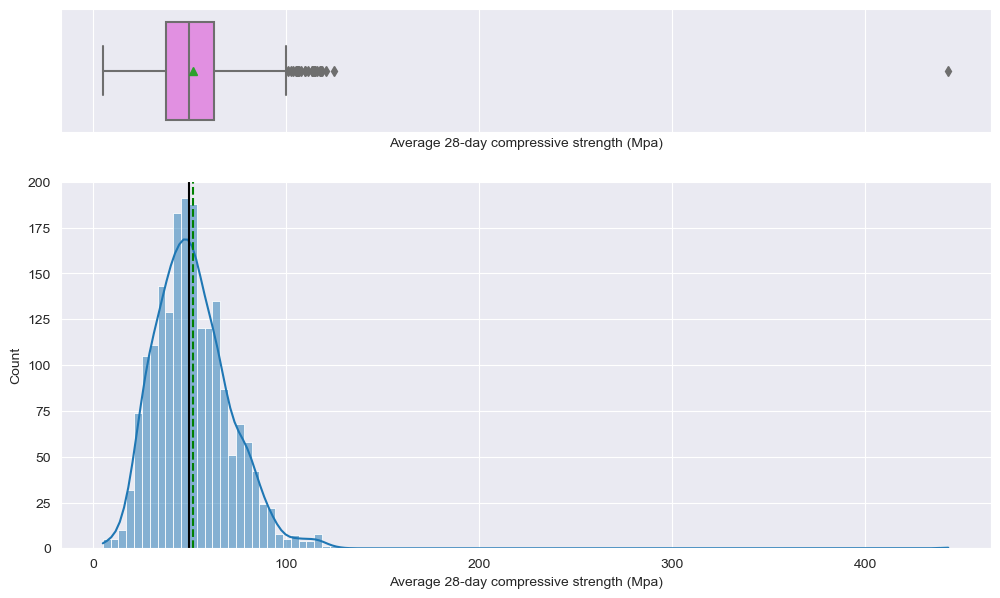

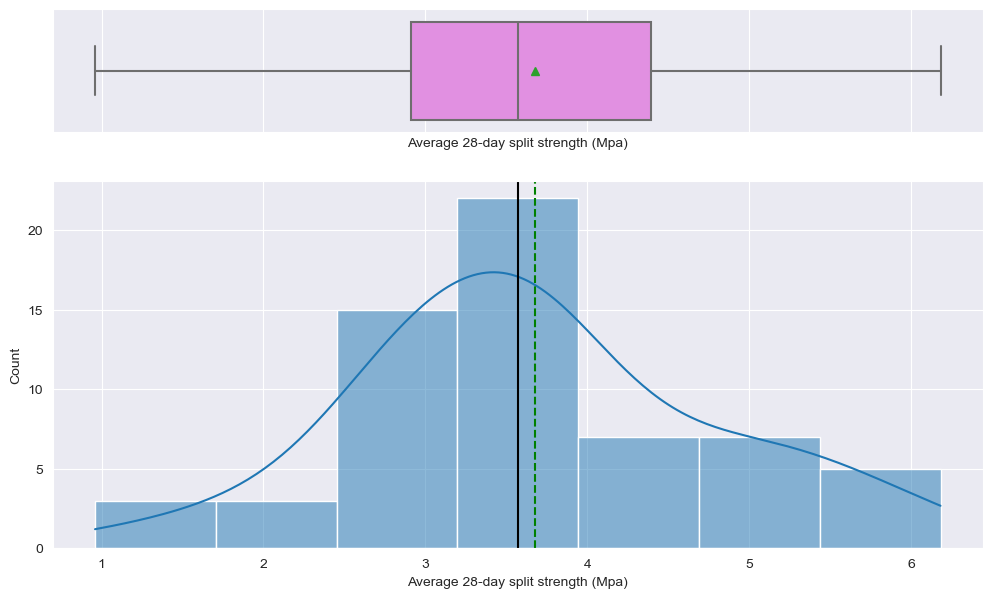

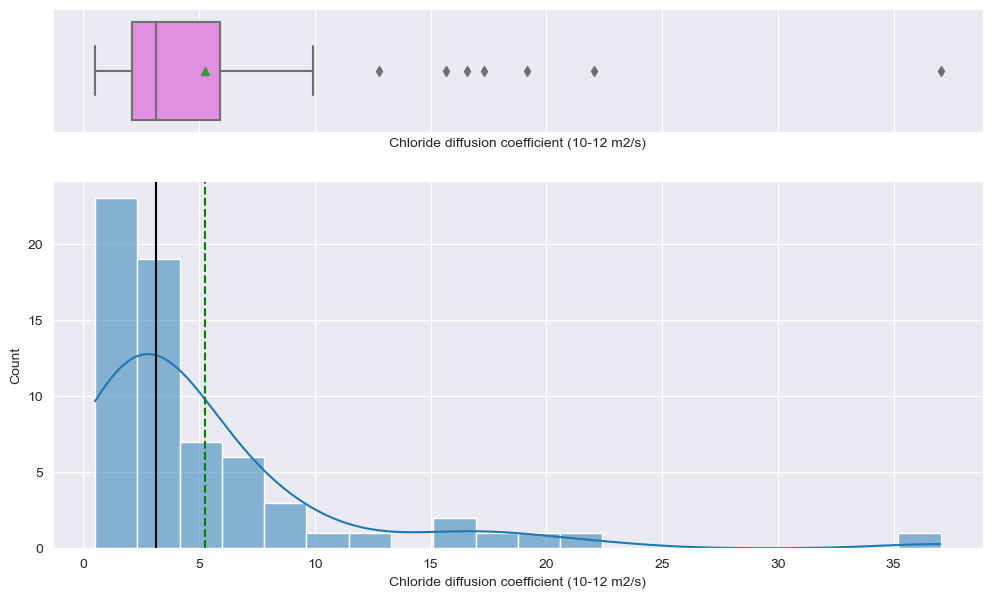

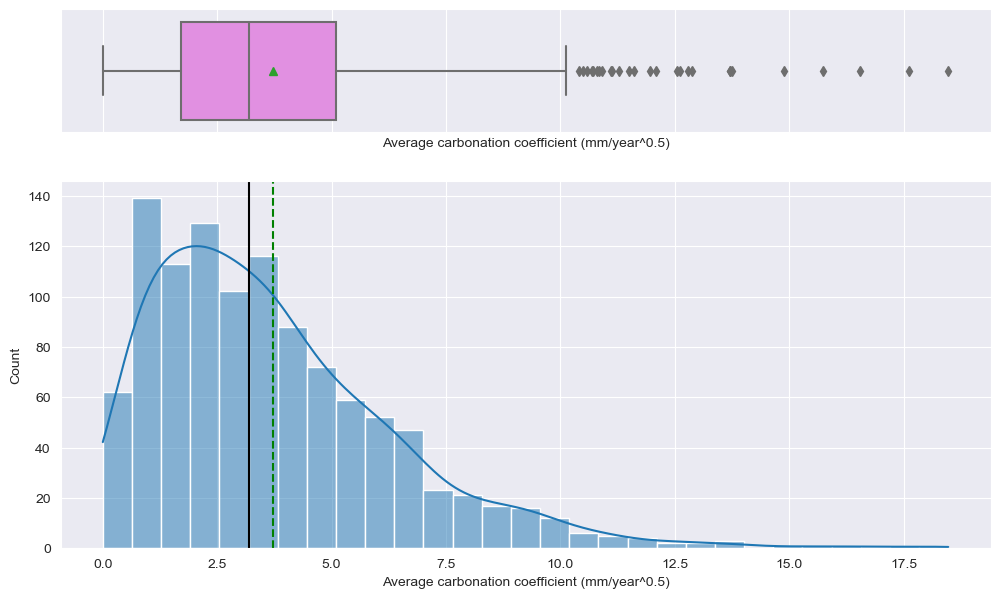

In [13]:
for col in num_df.columns:
    hist_boxplot(num_df, col)

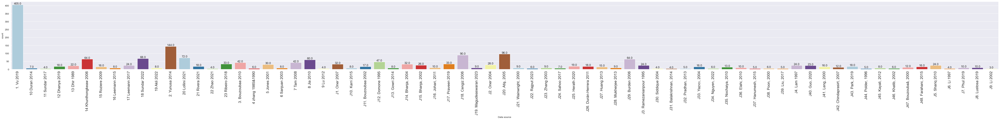

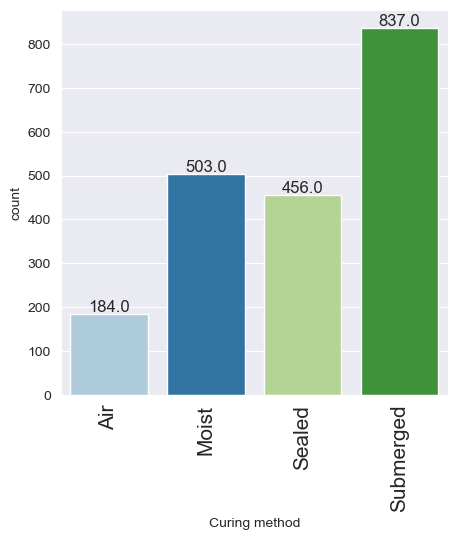

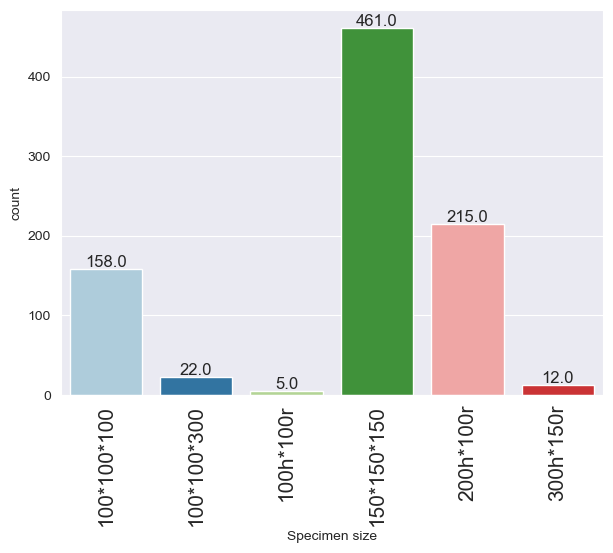

In [14]:
for col in obj_df.columns:
    labeled_barplot(obj_df, col)

Ignoring `palette` because no `hue` variable has been assigned.


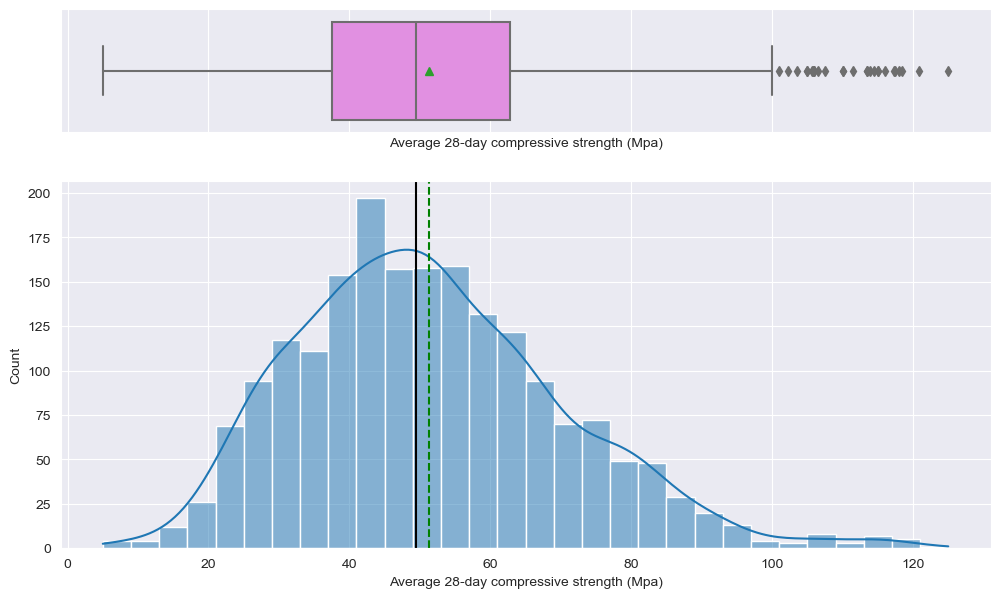

In [15]:
# Quick fix 

filtered_row = semi_df[semi_df['Average 28-day compressive strength (Mpa)'] > 400]

if len(filtered_row) == 1:
    value_to_divide = filtered_row['Average 28-day compressive strength (Mpa)'].values[0]
    updated_value = value_to_divide / 10

    # Update the value in the DataFrame
    semi_df.loc[semi_df['Average 28-day compressive strength (Mpa)'] > 400, 'Average 28-day compressive strength (Mpa)'] = updated_value
else:
    print("No rows or multiple rows matching the condition.")

hist_boxplot(semi_df, 'Average 28-day compressive strength (Mpa)')

In [16]:
semi_df

,Data source,ASTM type 1 ordinary Portland Cement content (kg/m^3),CEM I 42.5N ordinary Portland Cement content (kg/m^3),CEM I 52.5N ordinary Portland Cement content (kg/m^3),Class C Fly ash content (kg/m^3),Class F Fly ash content (kg/m^3),Slag content (kg/m^3),Silica fume content (kg/m^3),Water content (kg/m^3),Superplasticizer content (kg/m^3),...,Curing method,Curing temperature (Celsius degree),Curing humidity (%),Curing day,Slump (mm),Average 28-day compressive strength (Mpa),Average 28-day split strength (Mpa),Chloride diffusion coefficient (10-12 m2/s),Average carbonation coefficient (mm/year^0.5),Specimen size
0,2. Yunusa 2014,0.000,0.000,450.000,0.000,0.000,0.000,0.000,180.000,4.000,...,Submerged,20.000,100.000,3.000,30.000,75.930,NaN,NaN,3.139,NaN
1,2. Yunusa 2014,0.000,0.000,400.000,0.000,0.000,0.000,0.000,200.000,3.250,...,Submerged,20.000,100.000,3.000,60.000,64.500,NaN,NaN,4.022,NaN
2,2. Yunusa 2014,0.000,0.000,350.000,0.000,0.000,0.000,0.000,210.000,0.000,...,Submerged,20.000,100.000,3.000,100.000,49.230,NaN,NaN,6.670,NaN
3,2. Yunusa 2014,0.000,0.000,300.000,0.000,0.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,140.000,36.000,NaN,NaN,7.945,NaN
4,2. Yunusa 2014,0.000,0.000,315.000,0.000,135.000,0.000,0.000,180.000,1.750,...,Submerged,20.000,100.000,3.000,40.000,62.800,NaN,NaN,6.052,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,"J48. Farahani, 2015",350.000,0.000,0.000,0.000,0.000,0.000,50.000,180.000,2.000,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.550,NaN,150*150*150
1984,"J48. Farahani, 2015",380.000,0.000,0.000,0.000,0.000,0.000,20.000,200.000,0.800,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,3.375,NaN,150*150*150
1985,"J48. Farahani, 2015",370.000,0.000,0.000,0.000,0.000,0.000,30.000,200.000,1.200,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.000,NaN,150*150*150
1986,"J48. Farahani, 2015",360.000,0.000,0.000,0.000,0.000,0.000,40.000,200.000,1.800,...,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,0.500,NaN,150*150*150


In [17]:
semi_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ASTM type 1 ordinary Portland Cement content (kg/m^3),1988.000,39.318,106.826,0.000,0.000,0.000,0.000,702.000
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1988.000,95.567,146.591,0.000,0.000,0.000,210.000,547.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1988.000,147.093,152.375,0.000,0.000,155.000,280.000,660.000
Class C Fly ash content (kg/m^3),1988.000,6.120,28.792,0.000,0.000,0.000,0.000,225.000
Class F Fly ash content (kg/m^3),1988.000,35.498,65.745,0.000,0.000,0.000,56.500,544.000
Slag content (kg/m^3),1988.000,34.630,73.838,0.000,0.000,0.000,0.000,440.000
Silica fume content (kg/m^3),1988.000,7.593,21.082,0.000,0.000,0.000,0.000,150.000
Water content (kg/m^3),1988.000,172.241,28.372,105.000,153.000,170.000,186.000,295.000
Superplasticizer content (kg/m^3),1988.000,2.336,4.726,0.000,0.000,0.000,2.703,35.100
Maximum coarse aggregate size (mm),1988.000,18.122,3.829,9.500,16.000,20.000,20.000,30.000


In [18]:
semi_df[semi_df['Average carbonation coefficient (mm/year^0.5)'] >=10]

,Data source,ASTM type 1 ordinary Portland Cement content (kg/m^3),CEM I 42.5N ordinary Portland Cement content (kg/m^3),CEM I 52.5N ordinary Portland Cement content (kg/m^3),Class C Fly ash content (kg/m^3),Class F Fly ash content (kg/m^3),Slag content (kg/m^3),Silica fume content (kg/m^3),Water content (kg/m^3),Superplasticizer content (kg/m^3),...,Curing method,Curing temperature (Celsius degree),Curing humidity (%),Curing day,Slump (mm),Average 28-day compressive strength (Mpa),Average 28-day split strength (Mpa),Chloride diffusion coefficient (10-12 m2/s),Average carbonation coefficient (mm/year^0.5),Specimen size
7,2. Yunusa 2014,0.000,0.000,210.000,0.000,90.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,185.000,28.100,NaN,NaN,13.698,NaN
10,2. Yunusa 2014,0.000,0.000,175.000,0.000,0.000,175.000,0.000,210.000,0.000,...,Submerged,20.000,100.000,3.000,60.000,30.830,NaN,NaN,10.852,NaN
11,2. Yunusa 2014,0.000,0.000,150.000,0.000,0.000,150.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,110.000,22.870,NaN,NaN,15.745,NaN
23,2. Yunusa 2014,0.000,0.000,210.000,0.000,90.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,7.000,185.000,28.100,NaN,NaN,10.720,NaN
27,2. Yunusa 2014,0.000,0.000,150.000,0.000,0.000,150.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,7.000,110.000,22.870,NaN,NaN,12.880,NaN
54,2. Yunusa 2014,0.000,0.000,245.000,0.000,105.000,0.000,0.000,210.000,0.000,...,Submerged,20.000,100.000,3.000,170.000,37.800,NaN,NaN,11.097,NaN
55,2. Yunusa 2014,0.000,0.000,210.000,0.000,90.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,185.000,28.100,NaN,NaN,16.540,NaN
58,2. Yunusa 2014,0.000,0.000,175.000,0.000,0.000,175.000,0.000,210.000,0.000,...,Submerged,20.000,100.000,3.000,60.000,30.830,NaN,NaN,12.617,NaN
59,2. Yunusa 2014,0.000,0.000,150.000,0.000,0.000,150.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,3.000,110.000,22.870,NaN,NaN,18.477,NaN
71,2. Yunusa 2014,0.000,0.000,210.000,0.000,90.000,0.000,0.000,225.000,0.000,...,Submerged,20.000,100.000,7.000,185.000,28.100,NaN,NaN,14.878,NaN


## Bi variate

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


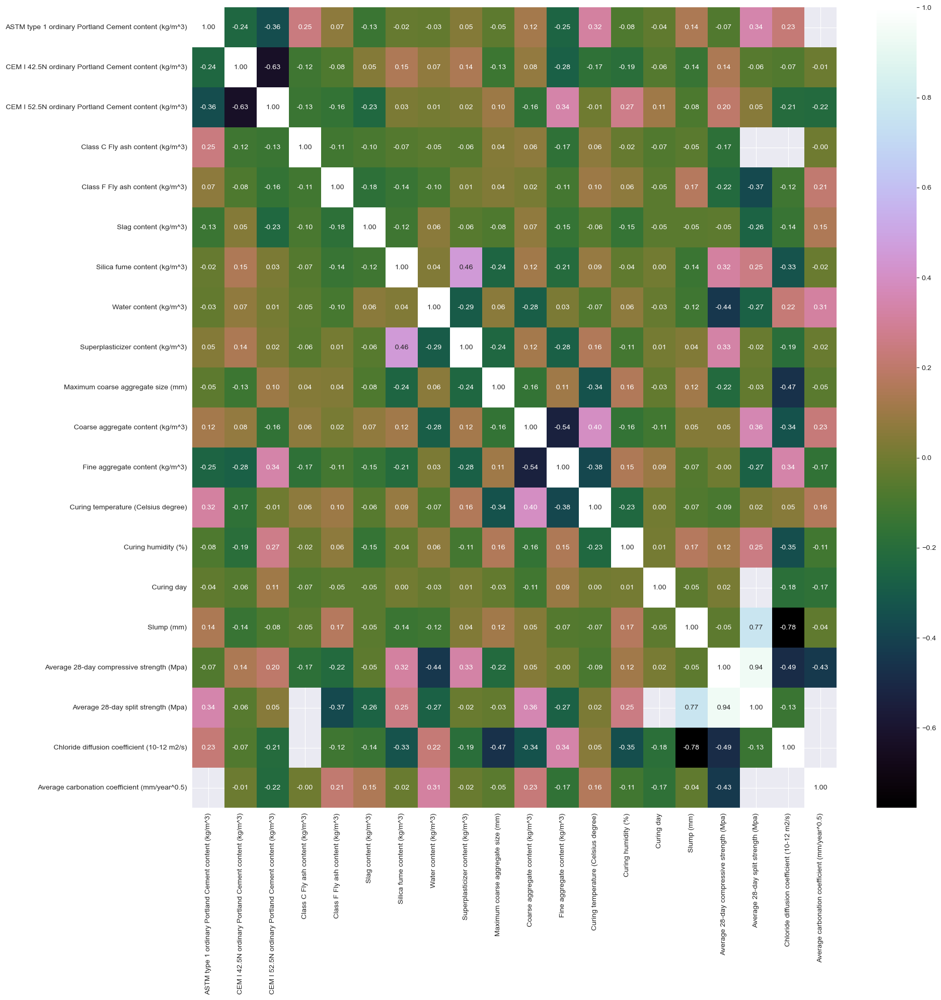

In [19]:
plt.figure(figsize=(20,20))
sns.heatmap(semi_df.corr(), annot = True, fmt='.2f', cmap = 'cubehelix')
plt.show()

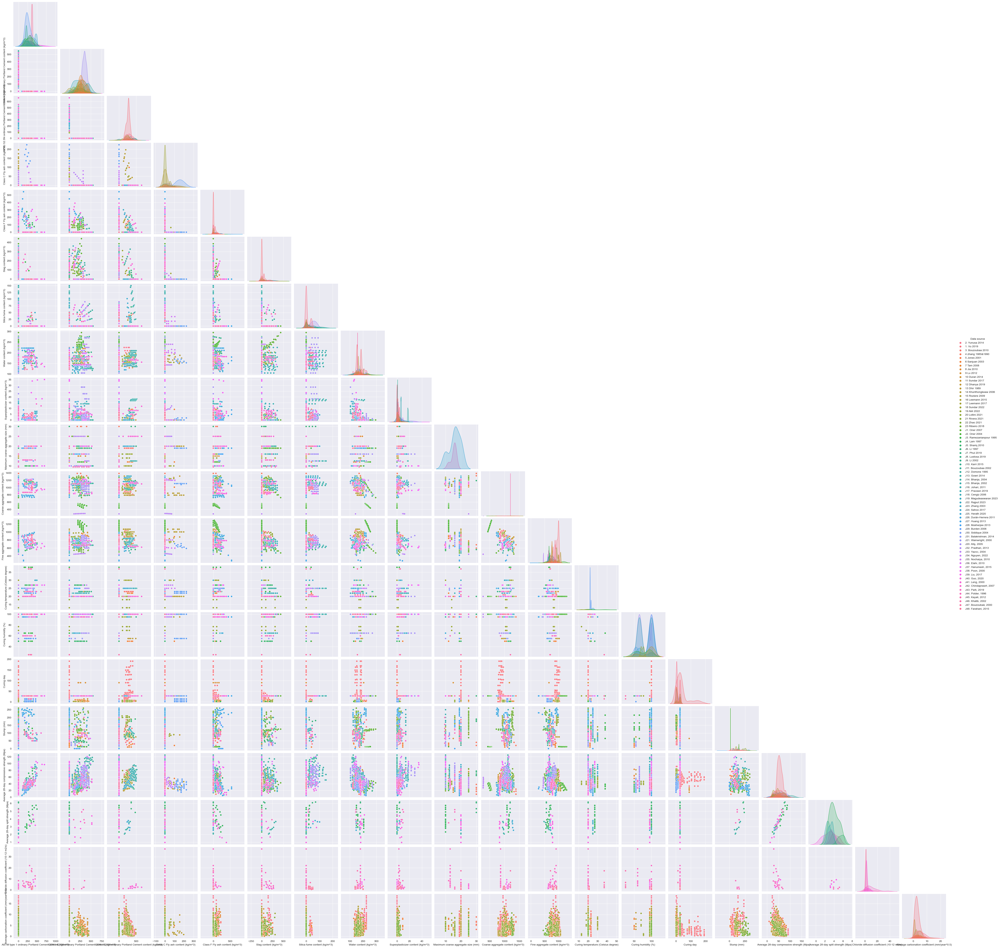

In [20]:
sns.pairplot(semi_df, hue= 'Data source', diag_kind= 'kde', corner=True);
plt.show()

## Tri-variate

### Coarse aggregate content, CEMI 42.5N ordinary Portland cement, and output

In [21]:
fig = px.scatter_3d(semi_df, x = 'CEM I 42.5N ordinary Portland Cement content (kg/m^3)', y = 'Average 28-day compressive strength (Mpa)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [22]:
fig = px.scatter_3d(semi_df, x = 'CEM I 42.5N ordinary Portland Cement content (kg/m^3)', y = 'Average carbonation coefficient (mm/year^0.5)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [23]:
fig = px.scatter_3d(semi_df, x = 'CEM I 42.5N ordinary Portland Cement content (kg/m^3)', y = 'Average 28-day split strength (Mpa)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [24]:
fig = px.scatter_3d(semi_df, x = 'CEM I 42.5N ordinary Portland Cement content (kg/m^3)', y = 'Chloride diffusion coefficient (10-12 m2/s)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [25]:
fig = px.scatter_3d(semi_df, x = 'CEM I 42.5N ordinary Portland Cement content (kg/m^3)', y = 'Slump (mm)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

Limited to the orange section
* When the coarse aggregate content is low, regardless of the portland cement's content, the slump is low.

## Coarse aggregate, Class C Fly ash, and output

In [26]:
fig = px.scatter_3d(semi_df, x = 'Class C Fly ash content (kg/m^3)', y = 'Average 28-day compressive strength (Mpa)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [27]:
fig = px.scatter_3d(semi_df, x = 'Class C Fly ash content (kg/m^3)', y = 'Average carbonation coefficient (mm/year^0.5)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [28]:
fig = px.scatter_3d(semi_df, x = 'Class C Fly ash content (kg/m^3)', y = 'Average 28-day split strength (Mpa)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [29]:
fig = px.scatter_3d(semi_df, x = 'Class C Fly ash content (kg/m^3)', y = 'Chloride diffusion coefficient (10-12 m2/s)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

In [30]:
fig = px.scatter_3d(semi_df, x = 'Class C Fly ash content (kg/m^3)', y = 'Slump (mm)', z = 'Coarse aggregate content (kg/m^3)', color='Data source')
fig.show()

* For orange: limited slump 

# Data - Preprocessing

## Outlier Detection

In [31]:
Q1 = semi_df.quantile(0.25)  # To find the 25th percentile
Q3 = semi_df.quantile(0.75)  # To find the 75th percentile

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

# Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower = (Q1 - 1.5 * IQR)
upper = (Q3 + 1.5 * IQR)

C:\Users\leeno\AppData\Local\Temp\ipykernel_3180\2928220998.py:1: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

C:\Users\leeno\AppData\Local\Temp\ipykernel_3180\2928220998.py:2: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [32]:
# checking the % outliers
outliers = ((semi_df.select_dtypes(include=["float64", "int64"]) < lower) | (semi_df.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(semi_df) * 100
outliers

ASTM type 1 ordinary Portland Cement content (kg/m^3)   13.431
CEM I 42.5N ordinary Portland Cement content (kg/m^3)    0.101
CEM I 52.5N ordinary Portland Cement content (kg/m^3)    0.000
Class C Fly ash content (kg/m^3)                         5.684
Class F Fly ash content (kg/m^3)                         8.300
Slag content (kg/m^3)                                   24.950
Silica fume content (kg/m^3)                            14.839
Water content (kg/m^3)                                   2.767
Superplasticizer content (kg/m^3)                        9.909
Maximum coarse aggregate size (mm)                       0.905
Coarse aggregate content (kg/m^3)                        1.811
Fine aggregate content (kg/m^3)                          0.201
Curing temperature (Celsius degree)                      7.696
Curing humidity (%)                                     10.010
Curing day                                               3.773
Slump (mm)                                             

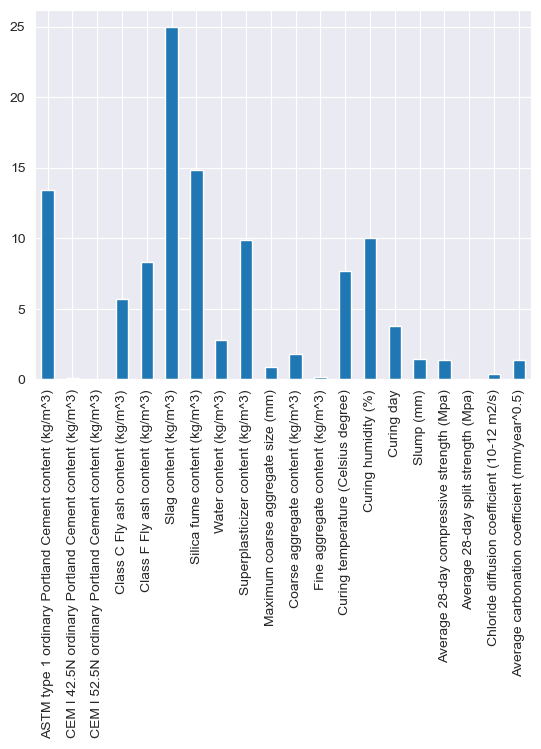

In [33]:
outliers.plot.bar()
plt.show()

## Feature Engineering 

In [34]:
for col in obj_df.columns:
    value_counts = obj_df[col].value_counts()
    print(f"Column '{col}':")
    print(value_counts)
    print()

Column 'Data source':
1. Vu 2019            405
2. Yunusa 2014        144
J20. Atiş, 2005        96
J18. Cengiz 2006       90
20 Lollini 2021        72
                     ... 
11 Sundar 2017          4
22 Zhao 2021            4
J6. Li 1997             4
J30. Siddique 2004      4
J9. Li 2002             3
Name: Data source, Length: 71, dtype: int64

Column 'Curing method':
Submerged    837
Moist        503
Sealed       456
Air          184
Name: Curing method, dtype: int64

Column 'Specimen size':
150*150*150    461
200h*100r      215
100*100*100    158
100*100*300     22
300h*150r       12
100h*100r        5
Name: Specimen size, dtype: int64


The carbonation coefficient of concrete is not directly dependent on the size of the concrete. However, it is influenced by several factors including the type of cement, temperature, relative humidity, and the presence of cracks123.

For instance, the carbonation coefficient increases by a factor of approximately 1.1 when the temperature rises from 20 to 30 °C and from 30 to 40 °C for plain and for blended cements (e.g., limestone and low calcium FA). For calcined clay blended cements, a higher increase of the carbonation coefficient was determined (by approximately a factor of 1.3)1.

Moreover, the presence of cracks can significantly affect the carbonation velocity coefficient. According to experimental results, the carbonation velocity coefficient of the cracking area can increase by up to 8 times depending on the crack width3.

Please note that these factors are complex and interrelated, and their effects on the carbonation coefficient can vary under different conditions. Therefore, it’s recommended to refer to specific experimental data or use predictive models for accurate estimations123.

1: https://link.springer.com/article/10.1617/s11527-020-01558-w
2: https://link.springer.com/article/10.1617/s11527-023-02104-0
3: https://www.hindawi.com/journals/amse/2016/4814609/

In [35]:
semi_df = semi_df.drop(['Data source', 'Specimen size'], axis = 1)
semi_df

,ASTM type 1 ordinary Portland Cement content (kg/m^3),CEM I 42.5N ordinary Portland Cement content (kg/m^3),CEM I 52.5N ordinary Portland Cement content (kg/m^3),Class C Fly ash content (kg/m^3),Class F Fly ash content (kg/m^3),Slag content (kg/m^3),Silica fume content (kg/m^3),Water content (kg/m^3),Superplasticizer content (kg/m^3),Maximum coarse aggregate size (mm),...,Fine aggregate content (kg/m^3),Curing method,Curing temperature (Celsius degree),Curing humidity (%),Curing day,Slump (mm),Average 28-day compressive strength (Mpa),Average 28-day split strength (Mpa),Chloride diffusion coefficient (10-12 m2/s),Average carbonation coefficient (mm/year^0.5)
0,0.000,0.000,450.000,0.000,0.000,0.000,0.000,180.000,4.000,20.000,...,800.000,Submerged,20.000,100.000,3.000,30.000,75.930,NaN,NaN,3.139
1,0.000,0.000,400.000,0.000,0.000,0.000,0.000,200.000,3.250,20.000,...,877.000,Submerged,20.000,100.000,3.000,60.000,64.500,NaN,NaN,4.022
2,0.000,0.000,350.000,0.000,0.000,0.000,0.000,210.000,0.000,20.000,...,869.000,Submerged,20.000,100.000,3.000,100.000,49.230,NaN,NaN,6.670
3,0.000,0.000,300.000,0.000,0.000,0.000,0.000,225.000,0.000,20.000,...,810.000,Submerged,20.000,100.000,3.000,140.000,36.000,NaN,NaN,7.945
4,0.000,0.000,315.000,0.000,135.000,0.000,0.000,180.000,1.750,20.000,...,800.000,Submerged,20.000,100.000,3.000,40.000,62.800,NaN,NaN,6.052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1983,350.000,0.000,0.000,0.000,0.000,0.000,50.000,180.000,2.000,20.000,...,806.000,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.550,NaN
1984,380.000,0.000,0.000,0.000,0.000,0.000,20.000,200.000,0.800,20.000,...,793.000,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,3.375,NaN
1985,370.000,0.000,0.000,0.000,0.000,0.000,30.000,200.000,1.200,20.000,...,784.000,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,1.000,NaN
1986,360.000,0.000,0.000,0.000,0.000,0.000,40.000,200.000,1.800,20.000,...,820.000,Submerged,21.000,100.000,28.000,NaN,NaN,NaN,0.500,NaN


In [36]:
curing_method = {'Air':0,
                 'Sealed':1,
                 'Moist':2,
                 'Submerged':3,
                 }

semi_df['Curing method'] = semi_df['Curing method'].map(curing_method)
semi_df['Curing method'].value_counts()

3.000    837
2.000    503
1.000    456
0.000    184
Name: Curing method, dtype: int64

In [37]:
new_df = semi_df.copy()
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1988 entries, 0 to 1987
Data columns (total 21 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   ASTM type 1 ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 1   CEM I 42.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 2   CEM I 52.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 3   Class C Fly ash content (kg/m^3)                       1988 non-null   float64
 4   Class F Fly ash content (kg/m^3)                       1988 non-null   float64
 5   Slag content (kg/m^3)                                  1988 non-null   float64
 6   Silica fume content (kg/m^3)                           1988 non-null   float64
 7   Water content (kg/m^3)                                 1988 non-null   float64
 8   Superplasticizer content (kg/m^3)               

In [38]:
new_df = new_df.drop(['Curing humidity (%)', 'Curing day','Slump (mm)', 'Chloride diffusion coefficient (10-12 m2/s)', 'Average 28-day split strength (Mpa)', 'Average 28-day compressive strength (Mpa)'], axis = 1)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1988 entries, 0 to 1987
Data columns (total 15 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   ASTM type 1 ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 1   CEM I 42.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 2   CEM I 52.5N ordinary Portland Cement content (kg/m^3)  1988 non-null   float64
 3   Class C Fly ash content (kg/m^3)                       1988 non-null   float64
 4   Class F Fly ash content (kg/m^3)                       1988 non-null   float64
 5   Slag content (kg/m^3)                                  1988 non-null   float64
 6   Silica fume content (kg/m^3)                           1988 non-null   float64
 7   Water content (kg/m^3)                                 1988 non-null   float64
 8   Superplasticizer content (kg/m^3)               

In [39]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ASTM type 1 ordinary Portland Cement content (kg/m^3),1988.000,39.318,106.826,0.000,0.000,0.000,0.000,702.000
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1988.000,95.567,146.591,0.000,0.000,0.000,210.000,547.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1988.000,147.093,152.375,0.000,0.000,155.000,280.000,660.000
Class C Fly ash content (kg/m^3),1988.000,6.120,28.792,0.000,0.000,0.000,0.000,225.000
Class F Fly ash content (kg/m^3),1988.000,35.498,65.745,0.000,0.000,0.000,56.500,544.000
Slag content (kg/m^3),1988.000,34.630,73.838,0.000,0.000,0.000,0.000,440.000
Silica fume content (kg/m^3),1988.000,7.593,21.082,0.000,0.000,0.000,0.000,150.000
Water content (kg/m^3),1988.000,172.241,28.372,105.000,153.000,170.000,186.000,295.000
Superplasticizer content (kg/m^3),1988.000,2.336,4.726,0.000,0.000,0.000,2.703,35.100
Maximum coarse aggregate size (mm),1988.000,18.122,3.829,9.500,16.000,20.000,20.000,30.000


# Missing values

In [40]:
new_df.isnull().sum()

ASTM type 1 ordinary Portland Cement content (kg/m^3)      0
CEM I 42.5N ordinary Portland Cement content (kg/m^3)      0
CEM I 52.5N ordinary Portland Cement content (kg/m^3)      0
Class C Fly ash content (kg/m^3)                           0
Class F Fly ash content (kg/m^3)                           0
Slag content (kg/m^3)                                      0
Silica fume content (kg/m^3)                               0
Water content (kg/m^3)                                     0
Superplasticizer content (kg/m^3)                          0
Maximum coarse aggregate size (mm)                         0
Coarse aggregate content (kg/m^3)                          5
Fine aggregate content (kg/m^3)                            5
Curing method                                              8
Curing temperature (Celsius degree)                        8
Average carbonation coefficient (mm/year^0.5)            893
dtype: int64

<Axes: >

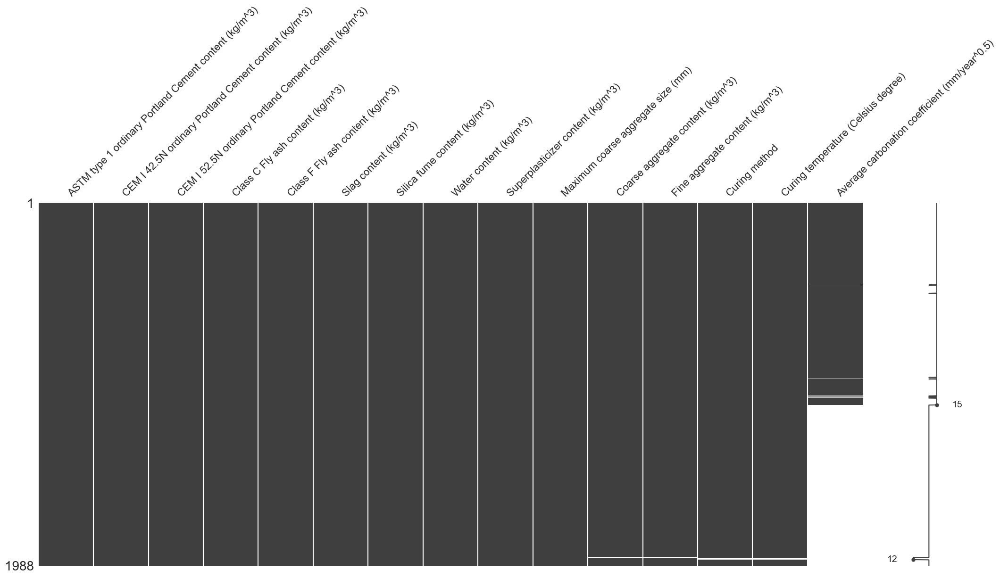

In [41]:
msno.matrix(new_df)

<Axes: >

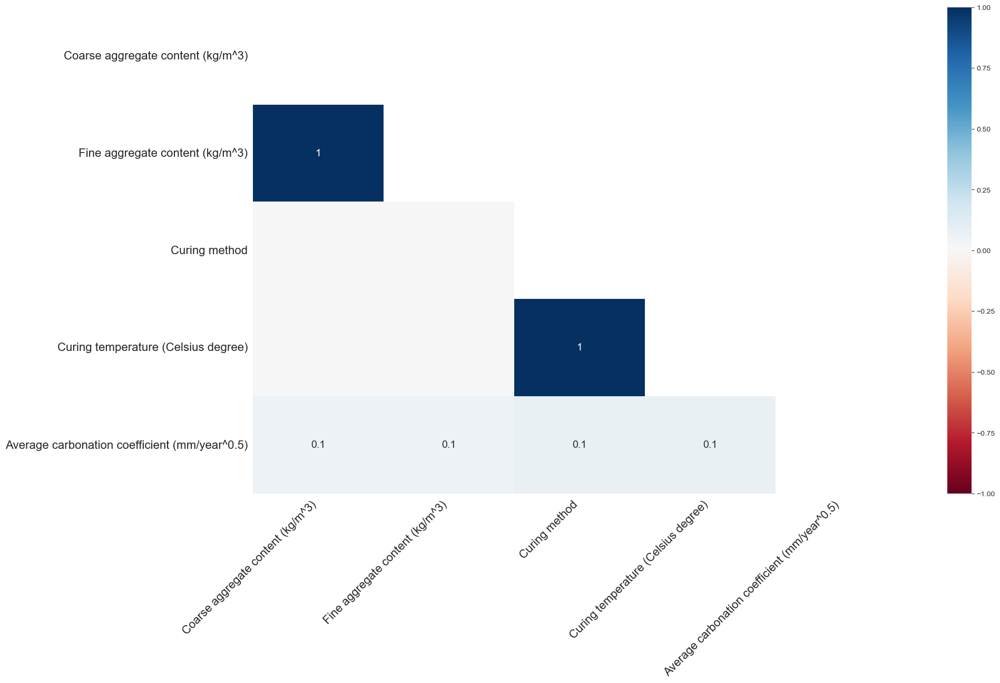

In [42]:
msno.heatmap(new_df)

# Train-Test split (drop na)

In [43]:
new_df_drop = new_df.copy()
new_df_drop.dropna(inplace = True)

In [44]:
new_df_drop.isnull().sum()

ASTM type 1 ordinary Portland Cement content (kg/m^3)    0
CEM I 42.5N ordinary Portland Cement content (kg/m^3)    0
CEM I 52.5N ordinary Portland Cement content (kg/m^3)    0
Class C Fly ash content (kg/m^3)                         0
Class F Fly ash content (kg/m^3)                         0
Slag content (kg/m^3)                                    0
Silica fume content (kg/m^3)                             0
Water content (kg/m^3)                                   0
Superplasticizer content (kg/m^3)                        0
Maximum coarse aggregate size (mm)                       0
Coarse aggregate content (kg/m^3)                        0
Fine aggregate content (kg/m^3)                          0
Curing method                                            0
Curing temperature (Celsius degree)                      0
Average carbonation coefficient (mm/year^0.5)            0
dtype: int64

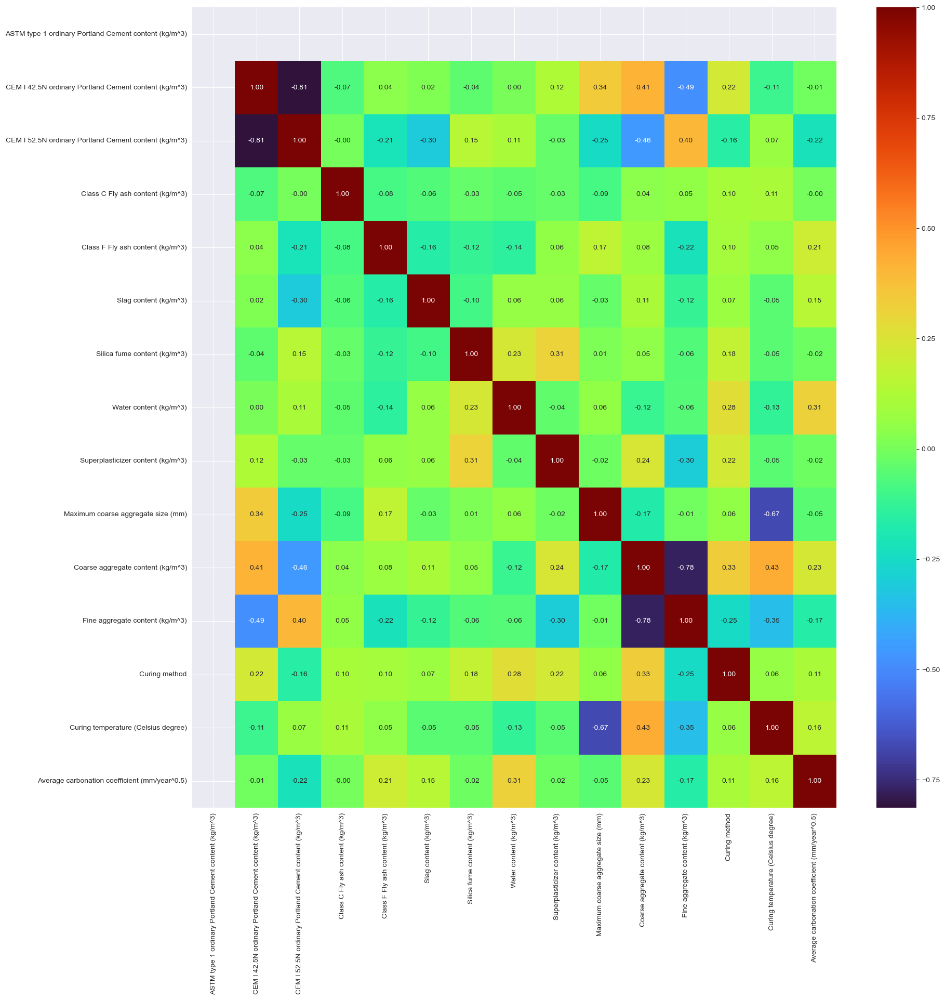

In [45]:
plt.figure(figsize=(20,20))
sns.heatmap(new_df_drop.corr(), annot = True, fmt='.2f', cmap = 'turbo')
plt.show()

In [46]:
new_df_drop.describe().T

,count,mean,std,min,25%,50%,75%,max
ASTM type 1 ordinary Portland Cement content (kg/m^3),1095.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1095.000,54.297,116.622,0.000,0.000,0.000,0.000,450.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1095.000,213.568,122.336,0.000,155.000,248.000,289.000,490.000
Class C Fly ash content (kg/m^3),1095.000,2.605,16.790,0.000,0.000,0.000,0.000,197.000
Class F Fly ash content (kg/m^3),1095.000,29.744,49.972,0.000,0.000,0.000,55.500,225.000
Slag content (kg/m^3),1095.000,26.436,56.988,0.000,0.000,0.000,0.000,310.000
Silica fume content (kg/m^3),1095.000,1.596,7.579,0.000,0.000,0.000,0.000,45.000
Water content (kg/m^3),1095.000,171.819,21.188,129.000,155.000,170.300,185.000,225.000
Superplasticizer content (kg/m^3),1095.000,0.554,1.305,0.000,0.000,0.000,0.000,9.176
Maximum coarse aggregate size (mm),1095.000,19.258,3.325,10.000,20.000,20.000,20.000,30.000


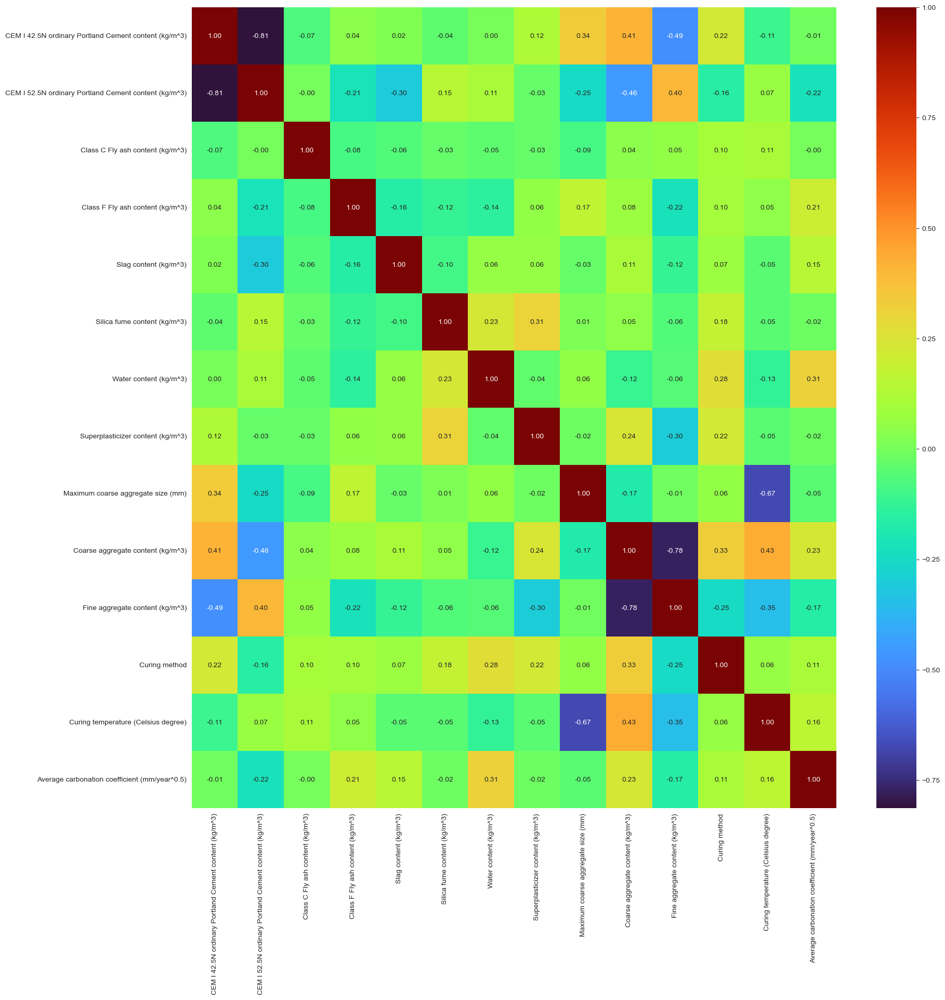

In [47]:
new_df_drop = new_df_drop.drop('ASTM type 1 ordinary Portland Cement content (kg/m^3)', axis = 1)
plt.figure(figsize=(20,20))
sns.heatmap(new_df_drop.corr(), annot = True, fmt='.2f', cmap = 'turbo')
plt.show()

In [48]:
new_df_drop.describe().T

,count,mean,std,min,25%,50%,75%,max
CEM I 42.5N ordinary Portland Cement content (kg/m^3),1095.000,54.297,116.622,0.000,0.000,0.000,0.000,450.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3),1095.000,213.568,122.336,0.000,155.000,248.000,289.000,490.000
Class C Fly ash content (kg/m^3),1095.000,2.605,16.790,0.000,0.000,0.000,0.000,197.000
Class F Fly ash content (kg/m^3),1095.000,29.744,49.972,0.000,0.000,0.000,55.500,225.000
Slag content (kg/m^3),1095.000,26.436,56.988,0.000,0.000,0.000,0.000,310.000
Silica fume content (kg/m^3),1095.000,1.596,7.579,0.000,0.000,0.000,0.000,45.000
Water content (kg/m^3),1095.000,171.819,21.188,129.000,155.000,170.300,185.000,225.000
Superplasticizer content (kg/m^3),1095.000,0.554,1.305,0.000,0.000,0.000,0.000,9.176
Maximum coarse aggregate size (mm),1095.000,19.258,3.325,10.000,20.000,20.000,20.000,30.000
Coarse aggregate content (kg/m^3),1095.000,980.891,143.882,779.000,868.000,955.000,1052.600,1388.600


In [49]:
X = new_df_drop.drop('Average carbonation coefficient (mm/year^0.5)', axis = 1)
Y = new_df_drop['Average carbonation coefficient (mm/year^0.5)']

In [50]:
X_big, X_test, y_big, y_test = train_test_split(X,Y, test_size = 0.2, random_state = 42,shuffle = True)
X_train, X_val, y_train, y_val = train_test_split(X_big,y_big, test_size = 0.2, random_state = 42,shuffle = True)

In [51]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(700, 13)
(176, 13)
(219, 13)


# Model Evaluation 

* MAE, RMSE, R-square, and Adjusted R-square

In [52]:
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

In [53]:
def model_performance_regression(predictors,target,pred):
    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE

    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
        },
        index=[0],
    )

    return df_perf

In [54]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingRegressor(random_state=42)))
models.append(("Random forest", RandomForestRegressor(random_state=42)))
models.append(("AdaBoost", AdaBoostRegressor(random_state=42)))
models.append(("Gradient_Boost", GradientBoostingRegressor(random_state=42)))
models.append(("XGBoost", XGBRegressor(random_state=42)))

In [55]:
print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)  # Convert y_train to a 1-dimensional array
    scores = mean_squared_error(y_train.values.ravel(), model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)  # Convert y_train to a 1-dimensional array
    scores_val = mean_squared_error(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 1.6667604459711574
Random forest: 1.5825730894057324
AdaBoost: 3.7995888859854947
Gradient_Boost: 1.8952137724045504
XGBoost: 1.4274977674125842

Validation Performance:

Bagging: 4.520349838030211
Random forest: 4.165758984632544
AdaBoost: 5.069179121477038
Gradient_Boost: 3.8954952781719707
XGBoost: 4.680226592324939


# Hyperparameter tuning 

## Bagging

In [56]:
%%time

Bagging_model = BaggingRegressor(random_state=42)

param_grid = {
    'n_estimators': [10, 50, 100],  # Number of base estimators (decision trees)
    'max_samples': [0.2, 0.3, 0.5, 0.8, 1.0],  # Proportion of samples to draw from the training set for each base estimator
    'max_features': [0.5, 0.8, 1.0],  # Proportion of features to consider for each base estimator
    'bootstrap': [True, False],  # Whether to sample with replacement (True) or without replacement (False)
    'random_state': [42]  # Random seed for reproducibility
}

scorer = metrics.make_scorer(mean_squared_error)

randomized_cv = RandomizedSearchCV(estimator=Bagging_model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=42)

randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'random_state': 42, 'n_estimators': 10, 'max_samples': 0.2, 'max_features': 0.5, 'bootstrap': True} with CV score=4.620475097584862:
CPU times: total: 109 ms
Wall time: 3.17 s


In [57]:
Tuned_Bagging = randomized_cv.best_estimator_
Tuned_Bagging = Tuned_Bagging.fit(X_train, y_train)
Tuned_Bagging_result = Tuned_Bagging.predict(X_val)
tuned_bagging_train = model_performance_regression(X_val, y_val, Tuned_Bagging_result)
tuned_bagging_train

,RMSE,MAE,R-squared,Adj. R-squared
0,2.078,1.555,0.437,0.392


## Random Forest

In [58]:
%%time

Random_Forest = RandomForestRegressor(random_state=42)

param_grid = {
    'n_estimators': [25, 50, 100, 200, 300, 500],  # Number of decision trees in the random forest
    'max_depth': [None, 5, 10, 15],  # Maximum depth of the decision trees
    'min_samples_split': [1, 2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': np.arange(1, 8),  # Minimum number of samples required to be at a leaf node
    'max_features': [None, 'sqrt', 'log2'],  # Number of features to consider at each split
    'bootstrap': [True, False],  # Whether to sample with replacement (True) or without replacement (False)
    'random_state': [42]  # Random seed for reproducibility
}

scorer = metrics.make_scorer(mean_squared_error)

randomized_cv = RandomizedSearchCV(estimator=Random_Forest, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=42)

randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


C:\Users\leeno\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning:


15 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\leeno\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\leeno\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\leeno\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\leeno\anaconda3\Lib\site-packages

Best parameters are {'random_state': 42, 'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': None, 'max_depth': None, 'bootstrap': False} with CV score=4.290672838124176:
CPU times: total: 234 ms
Wall time: 1.32 s


In [59]:
Tuned_forest = randomized_cv.best_estimator_
Tuned_forest = Tuned_forest.fit(X_train, y_train)
Tuned_forest_result = Tuned_forest.predict(X_val)
tuned_forest_train = model_performance_regression(X_val, y_val, Tuned_forest_result)
tuned_forest_train

,RMSE,MAE,R-squared,Adj. R-squared
0,2.038,1.503,0.458,0.415


## Ada Boost

In [60]:
%%time

Ada_boost = AdaBoostRegressor(random_state=42)

param_grid = {
    'n_estimators': [10, 25, 50, 100, 200, 500, 1000],  # Number of base estimators
    'learning_rate': [10, 5, 2.5, 1.5, 1, 0.5, 0.2, 0.1, 0.01, 0.001],  # Learning rate shrinks the contribution of each base estimator
    'loss': ['linear', 'square', 'exponential'],  # Loss function to use when updating the weights after each boosting iteration
    'random_state': [42]  # Random seed for reproducibility
}

scorer = metrics.make_scorer(mean_squared_error)

randomized_cv = RandomizedSearchCV(estimator=Ada_boost, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=42)

randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'random_state': 42, 'n_estimators': 50, 'loss': 'square', 'learning_rate': 10} with CV score=197.89628335228073:
CPU times: total: 62.5 ms
Wall time: 615 ms


In [61]:
Tuned_Ada = randomized_cv.best_estimator_
Tuned_Ada = Tuned_Ada.fit(X_train, y_train)
Tuned_Ada_result = Tuned_Ada.predict(X_val)
tuned_Ada_train = model_performance_regression(X_val, y_val, Tuned_Ada_result)
tuned_Ada_train

,RMSE,MAE,R-squared,Adj. R-squared
0,14.077,13.802,-24.847,-26.921


## Gradient Boosting 

In [62]:
%%time

GradientBoost = GradientBoostingRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200, 500, 750],  # Number of boosting stages
    'learning_rate': [1.2, 1, 0.1, 0.01, 0.001],  # Learning rate shrinks the contribution of each tree
    'max_depth': [3, 5, 7],  # Maximum depth of the individual regression estimators
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4,6, 8, 10],  # Minimum number of samples required to be at a leaf node
    'max_features': [None, 'sqrt', 'log2', 'sqrt'],  # Number of features to consider at each split
    'loss': ['absolute_error', 'squared_error', 'quantile', 'huber'],  # Loss function to optimize
    'random_state': [42]  # Random seed for reproducibility
}

scorer = metrics.make_scorer(mean_squared_error)

randomized_cv = RandomizedSearchCV(estimator=GradientBoost, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=42)

randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'random_state': 42, 'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'max_depth': 5, 'loss': 'quantile', 'learning_rate': 0.01} with CV score=14.246447359651418:
CPU times: total: 62.5 ms
Wall time: 2.94 s


In [63]:
Tuned_Gradient = randomized_cv.best_estimator_
Tuned_Gradient = Tuned_Gradient.fit(X_train, y_train)
Tuned_Gra_result = Tuned_Gradient.predict(X_val)
tuned_Gra_train = model_performance_regression(X_val, y_val, Tuned_Gra_result)
tuned_Gra_train

,RMSE,MAE,R-squared,Adj. R-squared
0,3.689,3.266,-0.775,-0.918


## XG Boost

In [64]:
%%time

XG_boost = XGBRegressor(random_state = 42)

param_grid = {
    'n_estimators': [25, 50, 100, 200, 500, 750],  # Number of boosting stages
    'learning_rate': [1, 0.2, 0.1, 0.01, 0.001],  # Learning rate shrinks the contribution of each tree
    'max_depth': [3, 5, 7, 9, 15],  # Maximum depth of a tree
    'subsample': [0.8, 0.9, 1.0],  # Subsample ratio of the training instances
    'colsample_bytree': [0.8, 0.9, 1.0],  # Subsample ratio of columns when constructing each tree
    'gamma': [0, 0.1, 0.2],  # Minimum loss reduction required to make a further partition on a leaf node
    'reg_alpha': [0, 0.1, 0.2, 0.5],  # L1 regularization term on weights
    'reg_lambda': [0, 0.1, 0.2, 0.5],  # L2 regularization term on weights
    'random_state': [42]  # Random seed for reproducibility
}

scorer = metrics.make_scorer(mean_squared_error)

randomized_cv = RandomizedSearchCV(estimator=XG_boost, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=42)

randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.8, 'reg_lambda': 0.1, 'reg_alpha': 0, 'random_state': 42, 'n_estimators': 750, 'max_depth': 15, 'learning_rate': 1, 'gamma': 0.2, 'colsample_bytree': 0.8} with CV score=71.84406529192657:
CPU times: total: 32.1 s
Wall time: 3.68 s


In [65]:
Tuned_XG = randomized_cv.best_estimator_
Tuned_XG = Tuned_XG.fit(X_train, y_train)
Tuned_XG_result = Tuned_XG.predict(X_val)
tuned_XG_train = model_performance_regression(X_val, y_val, Tuned_XG_result)
tuned_XG_train

,RMSE,MAE,R-squared,Adj. R-squared
0,5.360,2.866,-2.748,-3.048


# Summary for drop na

In [66]:
models_train_comp_df = pd.concat(
    [
        tuned_Ada_train.T,
        tuned_forest_train.T,
        tuned_bagging_train.T,
        tuned_Gra_train.T,
        tuned_XG_train.T
    ],
    axis=1,
)

models_train_comp_df.columns = [
    'Tuned_ada',
    'Tuned_forest',
    'Tuned_bagging',
    'Tuned_gradient',
    'Tuned_XG'
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Tuned_ada,Tuned_forest,Tuned_bagging,Tuned_gradient,Tuned_XG
RMSE,14.077,2.038,2.078,3.689,5.360
MAE,13.802,1.503,1.555,3.266,2.866
R-squared,-24.847,0.458,0.437,-0.775,-2.748
Adj. R-squared,-26.921,0.415,0.392,-0.918,-3.048


# Performance on the test set

In [67]:
test = Tuned_forest.predict(X_test)
Model_test = model_performance_regression(X_test, y_test, test)
Model_test

,RMSE,MAE,R-squared,Adj. R-squared
0,1.953,1.358,0.513,0.483


# SHAP

PermutationExplainer explainer: 1096it [07:36,  2.34it/s]                          


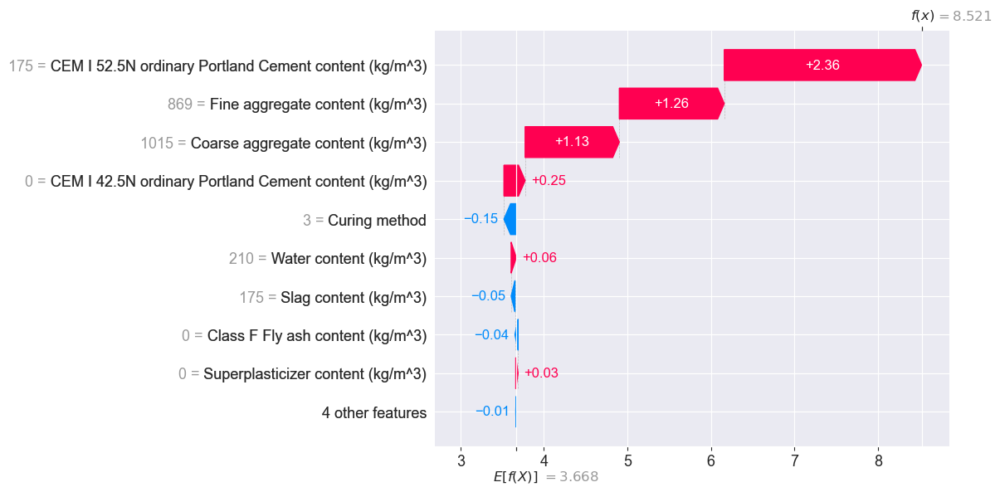

In [68]:
explainer = shap.Explainer(Tuned_forest.predict, X)
shap_values = explainer(X)
sample_ind = 42
shap.plots.waterfall(shap_values[sample_ind])

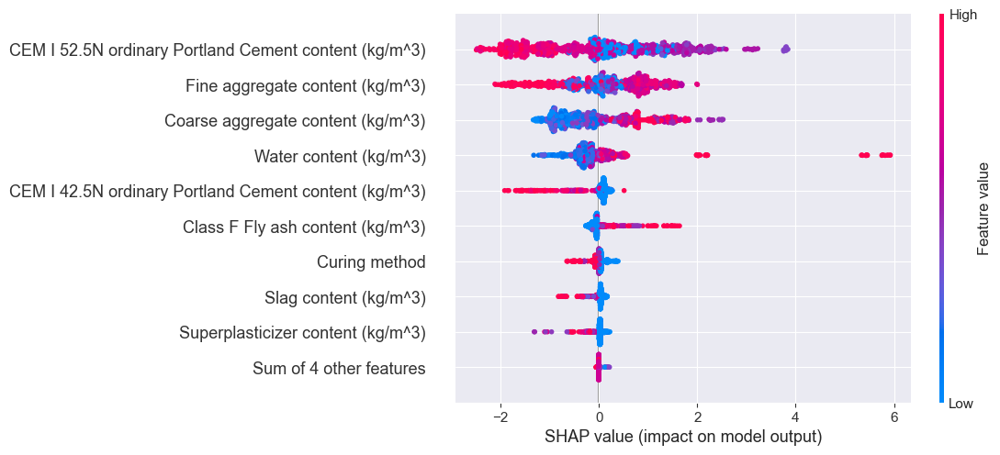

In [69]:
shap.plots.beeswarm(shap_values)

In [70]:
new_df_drop.iloc[42]

CEM I 42.5N ordinary Portland Cement content (kg/m^3)      0.000
CEM I 52.5N ordinary Portland Cement content (kg/m^3)    175.000
Class C Fly ash content (kg/m^3)                           0.000
Class F Fly ash content (kg/m^3)                           0.000
Slag content (kg/m^3)                                    175.000
Silica fume content (kg/m^3)                               0.000
Water content (kg/m^3)                                   210.000
Superplasticizer content (kg/m^3)                          0.000
Maximum coarse aggregate size (mm)                        20.000
Coarse aggregate content (kg/m^3)                       1015.000
Fine aggregate content (kg/m^3)                          869.000
Curing method                                              3.000
Curing temperature (Celsius degree)                       20.000
Average carbonation coefficient (mm/year^0.5)              6.560
Name: 42, dtype: float64

In [71]:
y_pred = Tuned_forest.predict(X)
df_predictions = pd.DataFrame({'True Values': Y, 'Predicted Values': y_pred})

In [72]:
df_predictions

,True Values,Predicted Values
0,3.139,1.787
1,4.022,2.436
2,6.670,4.003
3,7.945,4.395
4,6.052,4.278
...,...,...
1102,5.281,2.366
1103,3.573,2.366
1104,6.989,6.025
1105,3.289,2.366


In [73]:
df_predictions['Difference'] = df_predictions['True Values'] - df_predictions['Predicted Values']
df_predictions

,True Values,Predicted Values,Difference
0,3.139,1.787,1.352
1,4.022,2.436,1.586
2,6.670,4.003,2.667
3,7.945,4.395,3.550
4,6.052,4.278,1.774
...,...,...,...
1102,5.281,2.366,2.915
1103,3.573,2.366,1.208
1104,6.989,6.025,0.964
1105,3.289,2.366,0.923


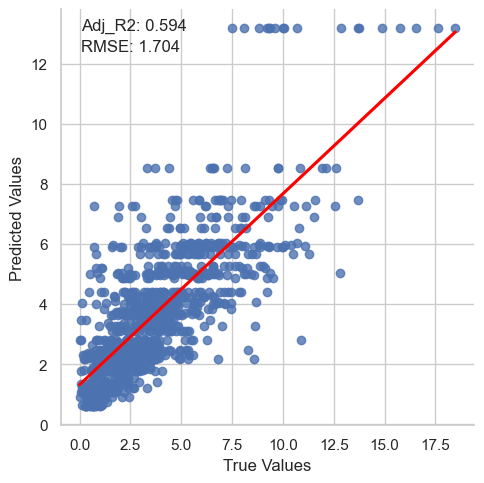

In [74]:
r2 = r2_score(df_predictions['True Values'], df_predictions['Predicted Values'])
rmse = mean_squared_error(df_predictions['True Values'], df_predictions['Predicted Values'], squared=False)
adj_r2 = adj_r2_score(X, Y, y_pred)

# Create the lmplot
sns.set(style="whitegrid")
lm_plot = sns.lmplot(data=df_predictions, x='True Values', y='Predicted Values', ci=True, line_kws={'color': 'red'})

# Annotate the plot with R2 and RMSE
plt.text(0.05, 0.95, f'Adj_R2: {adj_r2:.3f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.9, f'RMSE: {rmse:.3f}', transform=plt.gca().transAxes)

# Display the plot
plt.show()